In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import os, glob
import h5py
import fsspec
import datetime
from datetime import datetime
from pyproj import Proj, CRS
import matplotlib.pyplot as plt
import shapely.wkt as wkt
from shapely import geometry, ops
import pandas as pd
import xarray as xr
import rasterio
from rasterio.crs import CRS
from rasterio.transform import from_origin
from rasterio import merge
import folium
from folium import plugins
import rioxarray
import matplotlib as mpl
import sys
sys.path.append('../../')
from src.cslc_utils import get_s3path, read_cslc, cslc_info, rasterWrite, custom_merge, colorize, getbasemaps, moving_window_mean

import warnings
warnings.filterwarnings('ignore')

In [3]:
data_dir = '../TIFFs/ifgs/'
burst_id = ['T144-308014-IW2', 
            'T144-308015-IW2']
b1images = [os.path.basename(x) for x in glob.glob(f'../TIFFs/ifgs/IFG_{burst_id[0]}*')]
b1images = sorted(b1images)
b2images = [os.path.basename(x) for x in glob.glob(f'../TIFFs/ifgs/IFG_{burst_id[1]}*')]
b2images = sorted(b2images)
dates = [image[20:37] for image in b1images]
nd = len(dates)

# Check if dir to store tiffs exists and make if not
if os.path.exists("../TIFFs/ifg_diff_plots") == False:
    os.mkdir('../TIFFs/ifg_diff_plots')

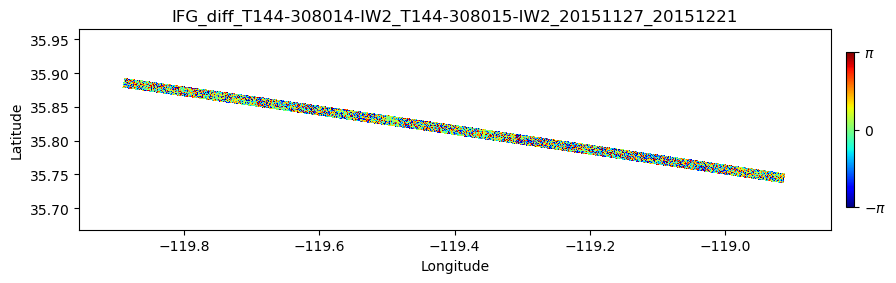

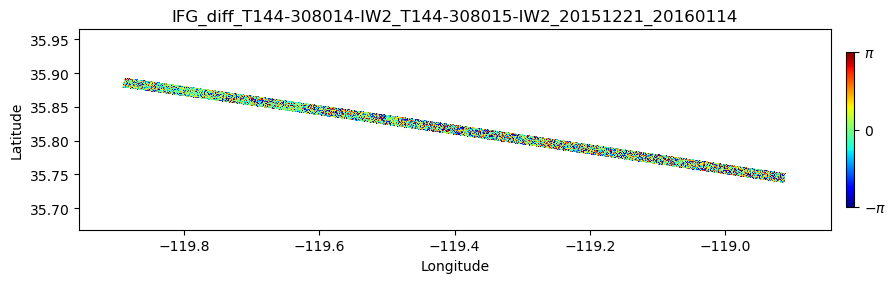

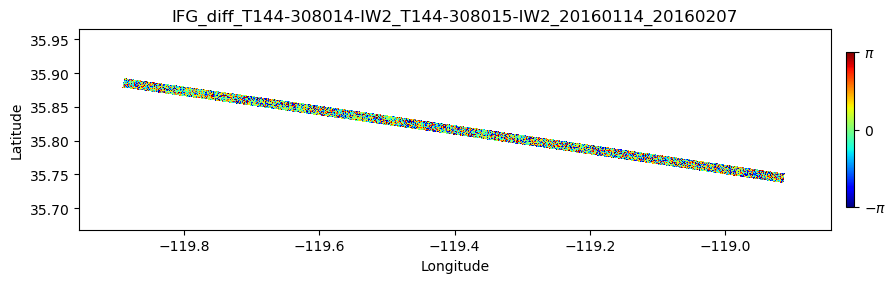

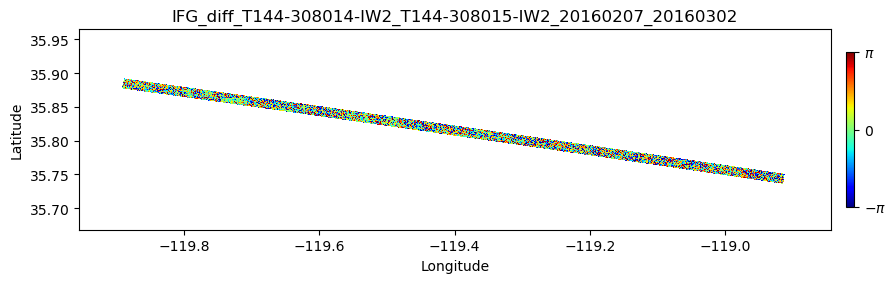

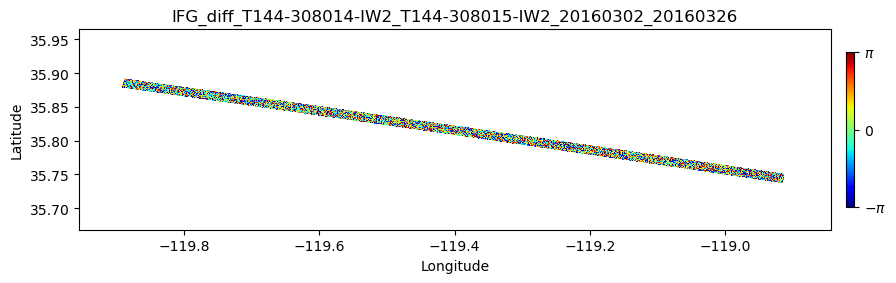

...

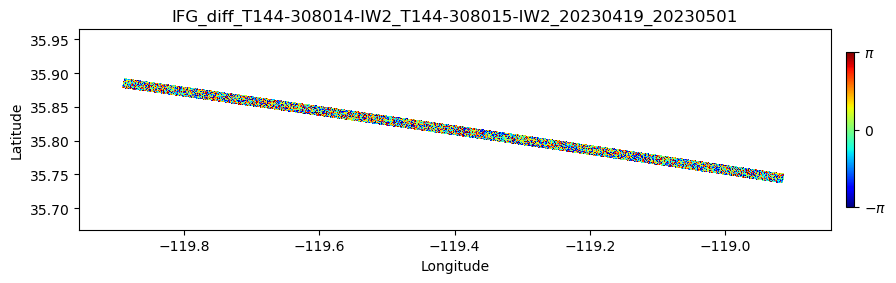

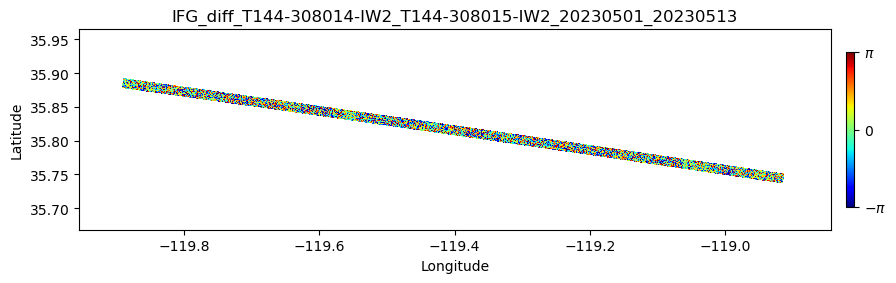

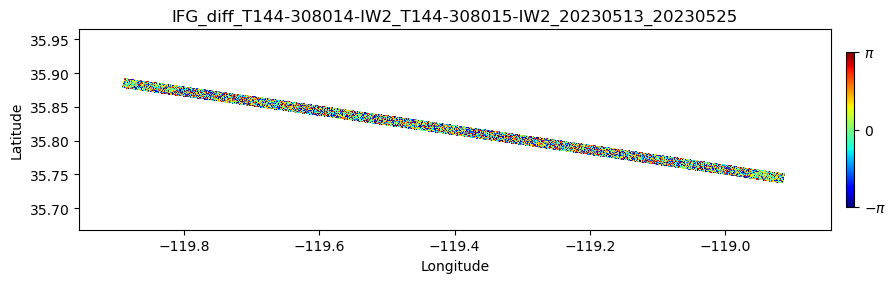

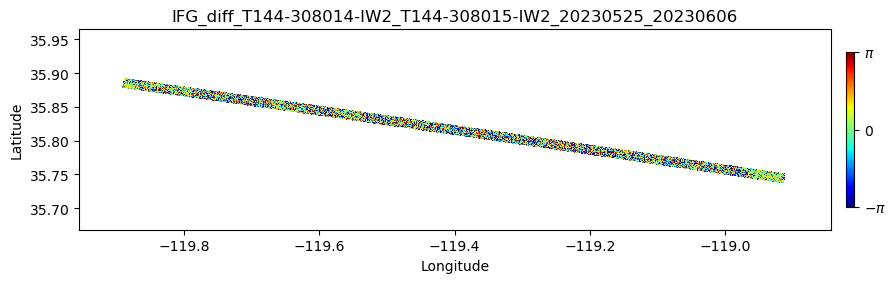

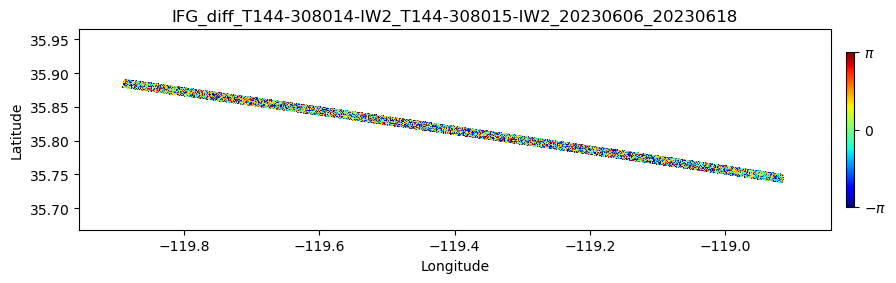

In [4]:
for i in range(nd):
    src = rioxarray.open_rasterio(data_dir+b1images[i])
    b1ifg = src.rio.reproject("EPSG:4326")[0]
    b1ifg_cpx = np.exp(1j * b1ifg)
    src = rioxarray.open_rasterio(data_dir+b2images[i])
    b2ifg = src.rio.reproject("EPSG:4326")[0]
    b2ifg_cpx = np.exp(1j * b2ifg)


    ifg_diff = b1ifg_cpx*np.conj(b2ifg_cpx)
    # coh = np.clip(np.abs(moving_window_mean(ifg_diff, 10)), 0, 1)

    # # Mask nan values and zero values based on merged ifg file
    # nan_mask = np.isnan(ifg)
    # zero_mask = ifg == 0
    # coh[nan_mask] = np.nan
    # coh[zero_mask] = 0

    minlon,minlat,maxlon,maxlat = b1ifg.rio.bounds()
    bbox = [minlon,maxlon,minlat,maxlat]

    # matplotlib plots and save to gif
    filename = f'IFG_diff_{burst_id[0]}_{burst_id[1]}_{dates[i]}_plot.tif'
    # Plot each interferogram
    fig, ax = plt.subplots(figsize=(10,3))
    cax = ax.imshow(np.angle(ifg_diff), cmap='jet',interpolation='nearest',origin='upper',extent=bbox, vmin=-np.pi, vmax=np.pi)
    cbar = fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
    cbar.set_ticks([-np.pi, 0., np.pi])
    cbar.set_ticklabels([r'$-\pi$', '$0$', r'$\pi$'])
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(filename[:-9],fontsize=12)
    plt.savefig('../TIFFs/ifg_diff_plots/'+filename,dpi=300,bbox_inches='tight')

In [6]:
imagenames = [os.path.basename(x) for x in glob.glob('../TIFFs/ifg_diff_plots/*')]
path = "../TIFFs/ifg_diff_plots/"
images = " ".join([path + filename for filename in imagenames])
os.system('convert -alpha deactivate -verbose -delay 50 -loop 0 -density 300 {} {}ifg_diff.gif'.format(images, path))

../TIFFs/ifg_diff_plots/IFG_diff_T144-308014-IW2_T144-308015-IW2_20151127_20151221_plot.tif TIFF 2681x849 2681x849+0+0 8-bit TrueColor sRGB 8.68309MiB 0.120u 0:00.022
../TIFFs/ifg_diff_plots/IFG_diff_T144-308014-IW2_T144-308015-IW2_20151221_20160114_plot.tif TIFF 2681x849 2681x849+0+0 8-bit TrueColor sRGB 8.68309MiB 0.130u 0:00.020
../TIFFs/ifg_diff_plots/IFG_diff_T144-308014-IW2_T144-308015-IW2_20160114_20160207_plot.tif TIFF 2681x849 2681x849+0+0 8-bit TrueColor sRGB 8.68309MiB 0.100u 0:00.014
../TIFFs/ifg_diff_plots/IFG_diff_T144-308014-IW2_T144-308015-IW2_20160207_20160302_plot.tif TIFF 2681x849 2681x849+0+0 8-bit TrueColor sRGB 8.68309MiB 0.110u 0:00.012
../TIFFs/ifg_diff_plots/IFG_diff_T144-308014-IW2_T144-308015-IW2_20160302_20160326_plot.tif TIFF 2681x849 2681x849+0+0 8-bit TrueColor sRGB 8.68309MiB 0.150u 0:00.016
../TIFFs/ifg_diff_plots/IFG_diff_T144-308014-IW2_T144-308015-IW2_20160326_20160419_plot.tif TIFF 2681x849 2681x849+0+0 8-bit TrueColor sRGB 8.68309MiB 0.100u 0:00.01

0